In [1]:
import torch
import matplotlib.pyplot as plt
from speechbrain.lobes.models.huggingface_wav2vec import HuggingFaceWav2Vec2
from speechbrain.dataio.dataio import read_audio


model_hub = "LeBenchmark/wav2vec2-FR-7K-base"
save_path = "model"
model = HuggingFaceWav2Vec2(model_hub, save_path)

/users/rwhetten/.conda/envs/lbe/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
torchvision is not available - cannot save figures
/users/rwhetten/.conda/envs/lbe/lib/python3.11/site-packages/transformers/configuration_utils.py:380: UserWarning: Passing `gradient_checkpointing` to a config initialization is deprecated and will be removed in v5 Transformers. Using `model.gradient_checkpointing_enable()` instead, or if you are using the `Trainer` API, pass `gradient_checkpointing=True` in your `TrainingArguments`.
  warnings.warn(


In [4]:
audio_file = "/users/lmaison/for_ryan/samples/common_voice_fr_18027195.wav"
signal = read_audio(audio_file).unsqueeze(0)
with torch.no_grad():
    outputs = model.model(signal, output_attentions=True)

/users/rwhetten/.conda/envs/lbe/lib/python3.11/site-packages/torch/utils/checkpoint.py:31: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn("None of the inputs have requires_grad=True. Gradients will be None")


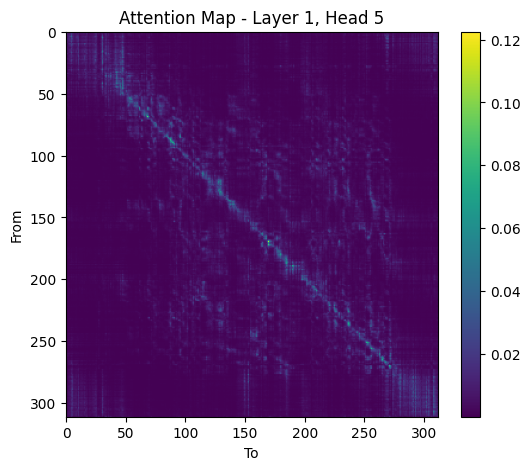

In [5]:
# Extract the attention weights
attention_weights = outputs.attentions

# Choose a layer and head to visualize (e.g., layer 1, head 2)
layer = 1
head = 5

# Get the attention weights for the selected layer and head
attention_weights_layer_head = attention_weights[layer][0][head]

# Plot the attention map as a heatmap
plt.figure(figsize=(6, 5))
plt.imshow(attention_weights_layer_head, cmap='viridis', aspect='auto')
plt.title(f'Attention Map - Layer {layer}, Head {head}')
plt.xlabel('To')
plt.ylabel('From')
plt.colorbar()
plt.show()

In [17]:
# model.model.encoder

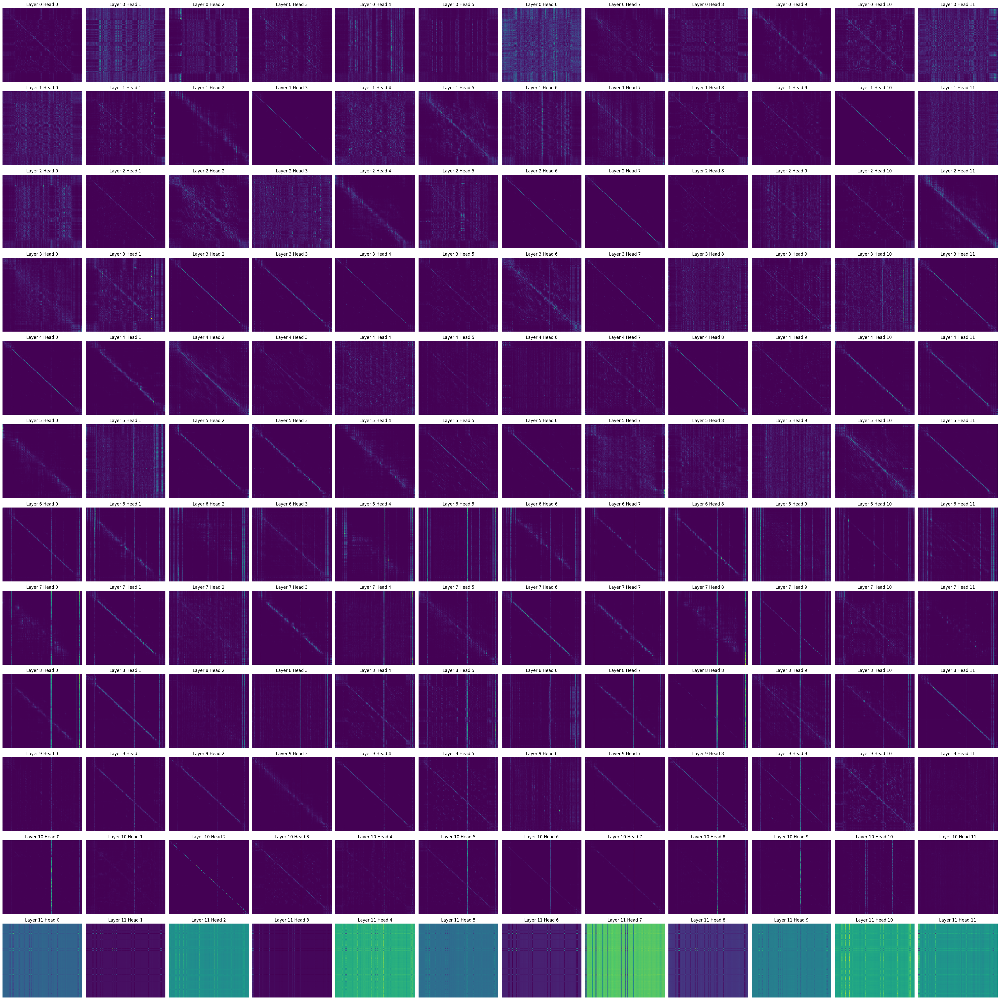

In [11]:
import matplotlib.pyplot as plt

# Create example matrices (you should replace these with your own data)
num_layer = 12
num_heads = 12
# matrix_data = [np.random.rand(10, 10) for _ in range(num_rows * num_cols)]

# Set up the figure and subplots
fig, axes = plt.subplots(num_layer, num_heads, figsize=(40, 40))

# Loop through matrices and create subplots
for i in range(num_layer):
    for j in range(num_heads):
        ax = axes[i, j]
        attention_weights_layer_head = attention_weights[i][0][j]
        
        # Plot the matrix as an image
        ax.imshow(attention_weights_layer_head, cmap='viridis', aspect='auto')
        
        # Optionally, you can add labels or other customization here
        ax.set_title(f'Layer {i} Head {j}')
        ax.axis('off')  # Turn off axis labels
        
# Adjust spacing between subplots if needed
plt.tight_layout()

# Show the plot
plt.show()

In [12]:
def get_diagonality(matrix):
    x, y = matrix.shape
    # print(matrix.shape)
    
    c = torch.zeros(x)
    for i in range(x):    
        s = torch.zeros(y)
        for j in range(y):
            
            # get weighted value
            s[j] = matrix[i,j] * abs(i-j)      
        # get max distance from i
        max = (torch.full((1,y),i) - torch.arange(y)).abs().max()
        # print('sum: ', s.sum())
        # print('max: ', max)
        
        # 1 - weighted sum / max distance
        c[i] = 1 - ( s.sum() / max )
    # print('c: ', c)
    return c.mean()

In [13]:
t = torch.tensor([[1,0,0,0,0]])
get_diagonality(t) # should give 1

tensor(1.)

In [14]:
t = torch.tensor([[0,0,0,0,1]])
get_diagonality(t) # should give 0

tensor(0.)

In [15]:
t = torch.tensor([[0.2,0.2,0.2,0.2,0.2]])
get_diagonality(t) # should give 0.5

tensor(0.5000)

In [16]:
t = torch.tensor([
    [0.2,0.2,0.2,0.2,0.2],
    [1,0,0,0,0],
    [0,0,0,0,1],
])
get_diagonality(t)

tensor(0.3889)

## Get Diagonality of base 
(and maybe large later)

In [ ]:
from tqdm import tqdm


In [17]:
D_base = torch.zeros(num_layer, num_heads)
for i in tqdm(range(num_layer)):
    for j in range(num_heads):
        attention_weights_layer_head = attention_weights[i][0][j]
        D_base[i,j] = get_diagonality(attention_weights_layer_head)

In [18]:
torch.save(D_base, 'base_pretrained_d_base.pt')

In [23]:
# model_hub = "LeBenchmark/wav2vec2-FR-7K-large"
# save_path = "model"
# model = HuggingFaceWav2Vec2(model_hub, save_path)

# signal = read_audio('../best-rq-test/spk1_snt1.wav').unsqueeze(0)
# with torch.no_grad():
#     outputs = model.model(signal, output_attentions=True)

# attention_weights = outputs.attentions


In [40]:
# num_layer = 24
# num_heads = 16
# D_large = torch.zeros(num_layer, num_heads)
# for i in range(num_layer):
#     for j in range(num_heads):
#         attention_weights_layer_head = attention_weights[i][0][j]
#         D_large[i,j] = get_diagonality(attention_weights_layer_head)


In [19]:
D_base[0,11]
# D_large.mean(dim=1)

tensor(0.5587)

## Plot Diagonalities

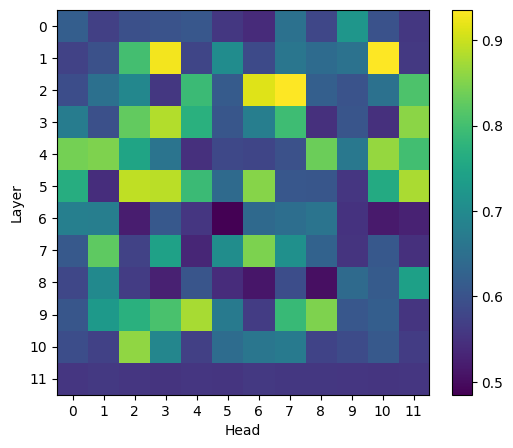

In [20]:
plt.figure(figsize=(6, 5))
plt.imshow(D_base, cmap='viridis', aspect='auto')

x_ticks_interval = 1
y_ticks_interval = 1

# Set the ticks for the x-axis and y-axis
plt.xticks(torch.arange(0, D_base.shape[1], x_ticks_interval))
plt.yticks(torch.arange(0, D_base.shape[0], y_ticks_interval))

# plt.title(f'Attention Map - Layer {layer}, Head {head}')
plt.xlabel('Head')
plt.ylabel('Layer')
plt.colorbar()
plt.show()

In [21]:
model_hub

'LeBenchmark/wav2vec2-FR-7K-base'

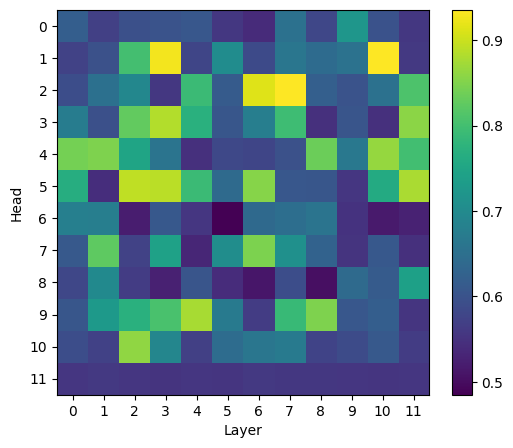

In [22]:
plt.figure(figsize=(6, 5))
plt.imshow(D_base, cmap='viridis', aspect='auto')

x_ticks_interval = 1
y_ticks_interval = 1

# Set the ticks for the x-axis and y-axis
plt.xticks(torch.arange(0, D_base.shape[1], x_ticks_interval))
plt.yticks(torch.arange(0, D_base.shape[0], y_ticks_interval))

# plt.title(f'Attention Map - Layer {layer}, Head {head}')
plt.xlabel('Layer')
plt.ylabel('Head')
plt.colorbar()
plt.show()

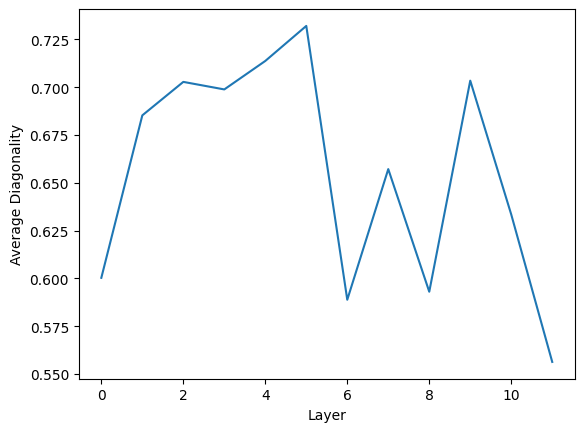

In [26]:
x = torch.arange(12)
y_b = D_base.mean(dim=1)
# y_l = D_large.mean(dim=1)


# Create a line plot
plt.plot(x, y_b)
# plt.plot(x, y_l)

# Add labels and title
plt.xlabel('Layer')
plt.ylabel('Average Diagonality')
plt.title('')

# Display the plot
plt.show()